In [5]:
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px 
%matplotlib inline
from sklearn.cluster import KMeans
from sklearn.neighbors import KDTree
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import RFE
from sklearn.svm import SVC
from sklearn import svm
from sklearn.linear_model import LogisticRegression

In [6]:
df = pd.read_csv('data (1).csv')

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2017 entries, 0 to 2016
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        2017 non-null   int64  
 1   acousticness      2017 non-null   float64
 2   danceability      2017 non-null   float64
 3   duration_ms       2017 non-null   int64  
 4   energy            2017 non-null   float64
 5   instrumentalness  2017 non-null   float64
 6   key               2017 non-null   int64  
 7   liveness          2017 non-null   float64
 8   loudness          2017 non-null   float64
 9   mode              2017 non-null   int64  
 10  speechiness       2017 non-null   float64
 11  tempo             2017 non-null   float64
 12  time_signature    2017 non-null   float64
 13  valence           2017 non-null   float64
 14  target            2017 non-null   int64  
 15  song_title        2017 non-null   object 
 16  artist            2017 non-null   object 


In [8]:
df[df['loudness']==df['loudness'].max()]

,Unnamed: 0,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target,song_title,artist
195,195,0.613,0.698,230200,0.878,0.000016,8,0.518,-0.307,1,0.314,182.126,4.0,0.816,1,GodLovesUgly,Atmosphere


In [9]:
df[df['loudness']== -0.307]['song_title']

195    GodLovesUgly
Name: song_title, dtype: object

In [10]:
df.head(30)

,Unnamed: 0,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target,song_title,artist
0,0,0.010200,0.833,204600,0.434,0.021900,2,0.1650,-8.795,1,0.4310,150.062,4.0,0.286,1,Mask Off,Future
1,1,0.199000,0.743,326933,0.359,0.006110,1,0.1370,-10.401,1,0.0794,160.083,4.0,0.588,1,Redbone,Childish Gambino
2,2,0.034400,0.838,185707,0.412,0.000234,2,0.1590,-7.148,1,0.2890,75.044,4.0,0.173,1,Xanny Family,Future
3,3,0.604000,0.494,199413,0.338,0.510000,5,0.0922,-15.236,1,0.0261,86.468,4.0,0.230,1,Master Of None,Beach House
4,4,0.180000,0.678,392893,0.561,0.512000,5,0.4390,-11.648,0,0.0694,174.004,4.0,0.904,1,Parallel Lines,Junior Boys
5,5,0.004790,0.804,251333,0.560,0.000000,8,0.1640,-6.682,1,0.1850,85.023,4.0,0.264,1,Sneakin’,Drake
6,6,0.014500,0.739,241400,0.472,0.000007,1,0.2070,-11.204,1,0.1560,80.030,4.0,0.308,1,Childs Play,Drake
7,7,0.020200,0.266,349667,0.348,0.664000,10,0.1600,-11.609,0,0.0371,144.154,4.0,0.393,1,Gyöngyhajú lány,Omega
8,8,0.048100,0.603,202853,0.944,0.000000,11,0.3420,-3.626,0,0.3470,130.035,4.0,0.398,1,I've Seen Footage,Death Grips
9,9,0.002080,0.836,226840,0.603,0.000000,7,0.5710,-7.792,1,0.2370,99.994,4.0,0.386,1,Digital Animal,Honey Claws


In [11]:
df.tail()

,Unnamed: 0,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target,song_title,artist
2012,2012,0.00106,0.584,274404,0.932,0.002690,1,0.1290,-3.501,1,0.333,74.976,4.0,0.211,0,Like A Bitch - Kill The Noise Remix,Kill The Noise
2013,2013,0.08770,0.894,182182,0.892,0.001670,1,0.0528,-2.663,1,0.131,110.041,4.0,0.867,0,Candy,Dillon Francis
2014,2014,0.00857,0.637,207200,0.935,0.003990,0,0.2140,-2.467,1,0.107,150.082,4.0,0.470,0,Habit - Dack Janiels & Wenzday Remix,Rain Man
2015,2015,0.00164,0.557,185600,0.992,0.677000,1,0.0913,-2.735,1,0.133,150.011,4.0,0.623,0,First Contact,Twin Moons
2016,2016,0.00281,0.446,204520,0.915,0.000039,9,0.2180,-6.221,1,0.141,190.013,4.0,0.402,0,I Wanna Get Better,Bleachers


In [12]:
df[df['duration_ms']== 185707]['song_title']

2    Xanny Family
Name: song_title, dtype: object

In [13]:
df[df['duration_ms']== 185707]['artist']

2    Future
Name: artist, dtype: object

In [14]:
df[df['artist']== 'Rain Man']['song_title']

2014    Habit - Dack Janiels & Wenzday Remix
Name: song_title, dtype: object

In [15]:
df[df['artist']== 'Kendrick Lamar']['song_title']

157                                       Alright
421     Swimming Pools (Drank) - Extended Version
526                                   Money Trees
662                                  m.A.A.d city
1162                                      HUMBLE.
1226    Swimming Pools (Drank) - Extended Version
Name: song_title, dtype: object

In [16]:
df[df['artist']== 'Drake']['song_title']

5                        Sneakin’
6                     Childs Play
37                        Jumpman
117                 Hotline Bling
154                     Big Rings
158                 Know Yourself
168               Wu-Tang Forever
440                     Headlines
589       Started From the Bottom
676     Hold On, We're Going Home
717     Hold On, We're Going Home
779       0 To 100 / The Catch Up
1016             Skepta Interlude
1183                 Passionfruit
1218              Best I Ever Had
1223                    Take Care
Name: song_title, dtype: object

In [17]:
newdf = df.drop(columns = ['song_title','speechiness','instrumentalness','target','tempo','valence','time_signature','artist'])

In [18]:
newdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2017 entries, 0 to 2016
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    2017 non-null   int64  
 1   acousticness  2017 non-null   float64
 2   danceability  2017 non-null   float64
 3   duration_ms   2017 non-null   int64  
 4   energy        2017 non-null   float64
 5   key           2017 non-null   int64  
 6   liveness      2017 non-null   float64
 7   loudness      2017 non-null   float64
 8   mode          2017 non-null   int64  
dtypes: float64(5), int64(4)
memory usage: 141.9 KB


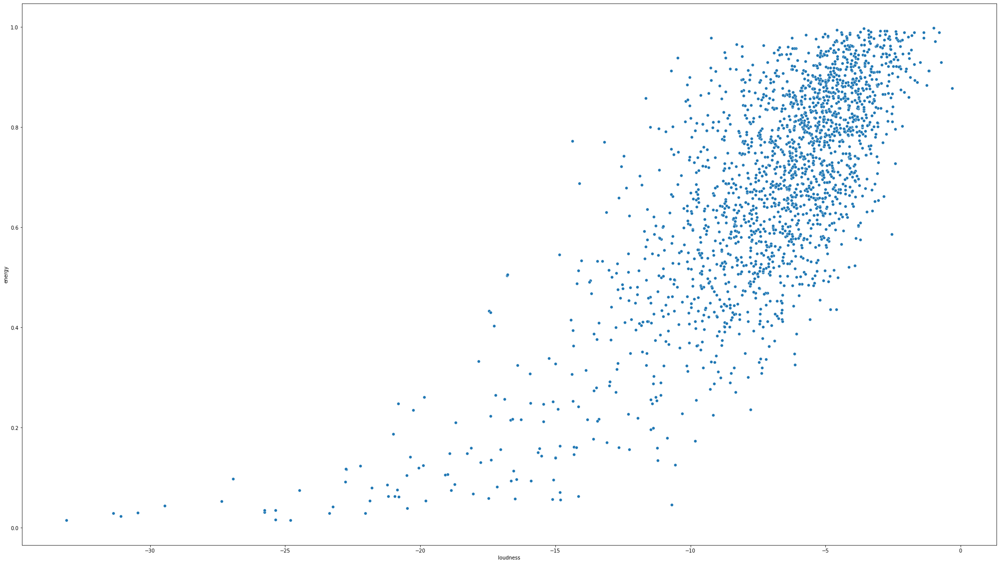

In [19]:
plt.figure(figsize=(35,20))
sns.scatterplot(x='loudness', y='energy',data=newdf)
plt.show()

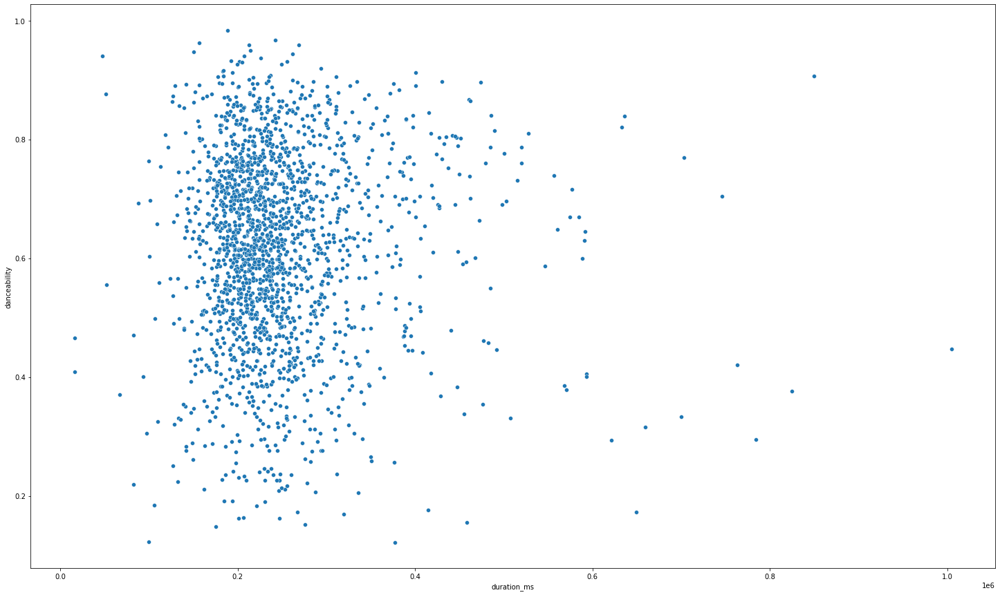

In [20]:
plt.figure(figsize=(25,15))
sns.scatterplot(x='duration_ms', y='danceability',data=newdf)
plt.show()

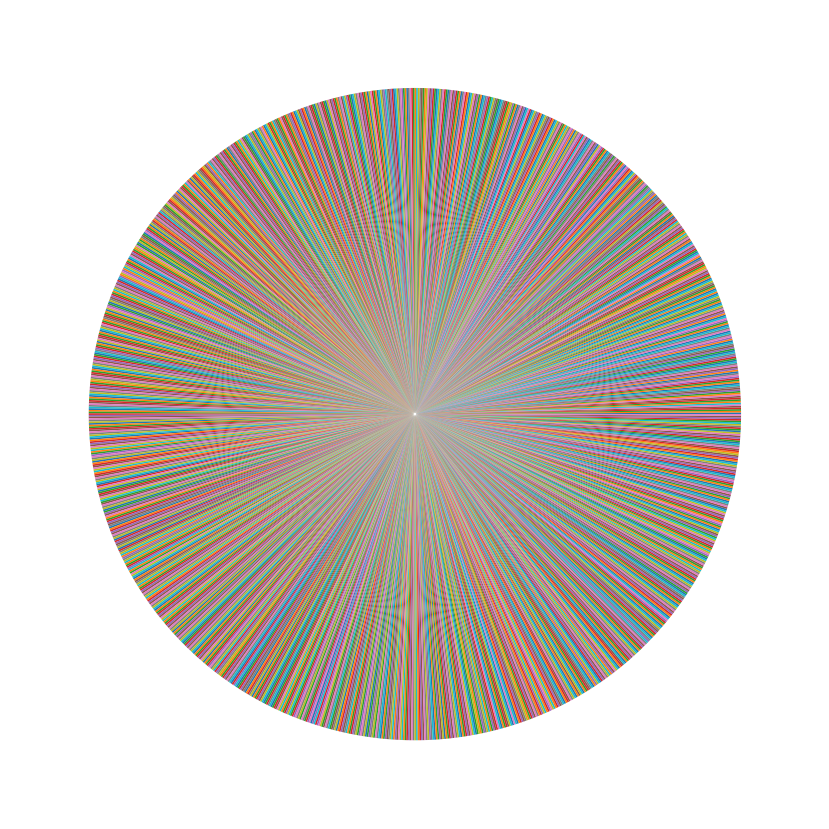

In [25]:
plt.figure(figsize=(25,15))
plt.pie(x='mode',data=df)
plt.show()

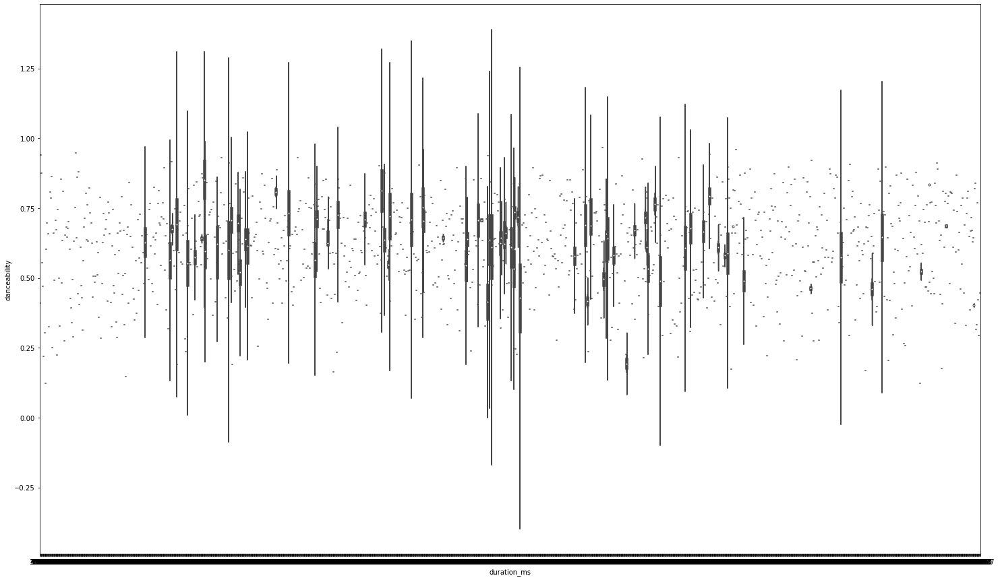

In [18]:
plt.figure(figsize=(25,15))
sns.violinplot(x='duration_ms', y='danceability',data=newdf)
plt.show()

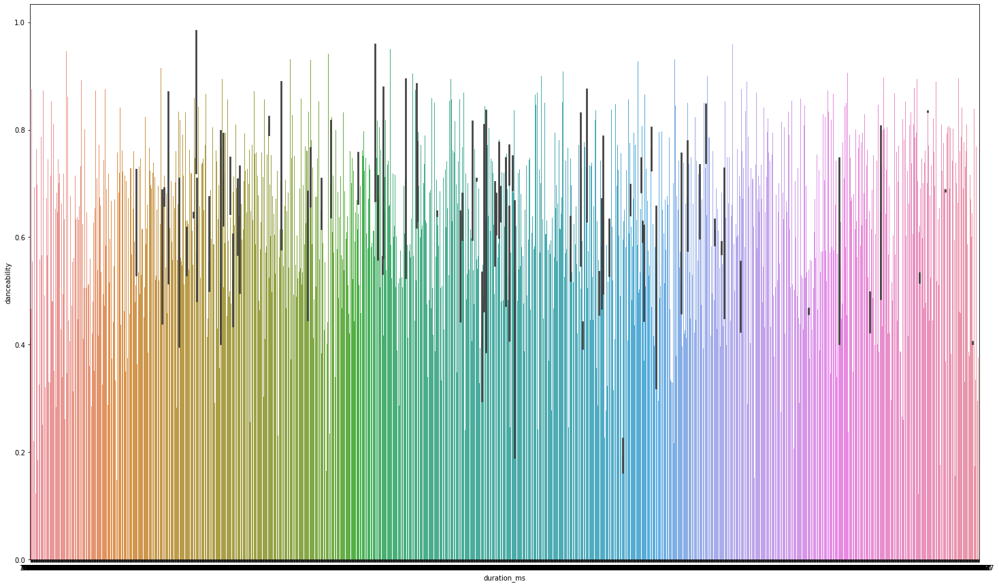

In [19]:
plt.figure(figsize=(25,15))
sns.barplot(x='duration_ms', y='danceability',data=newdf)
plt.show()

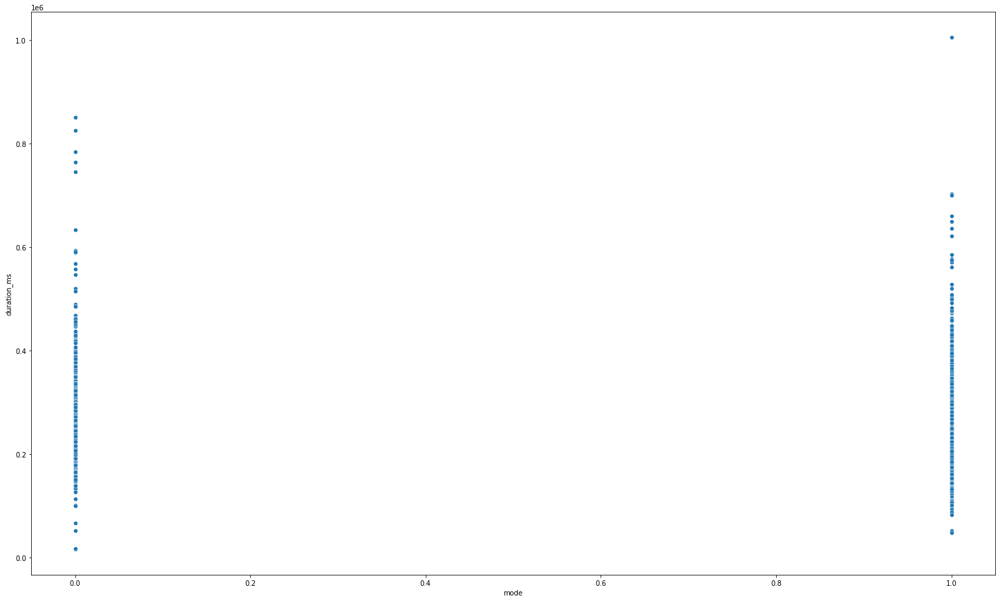

In [20]:
plt.figure(figsize=(25,15))
sns.scatterplot(x='mode', y='duration_ms',data=newdf)
plt.show()

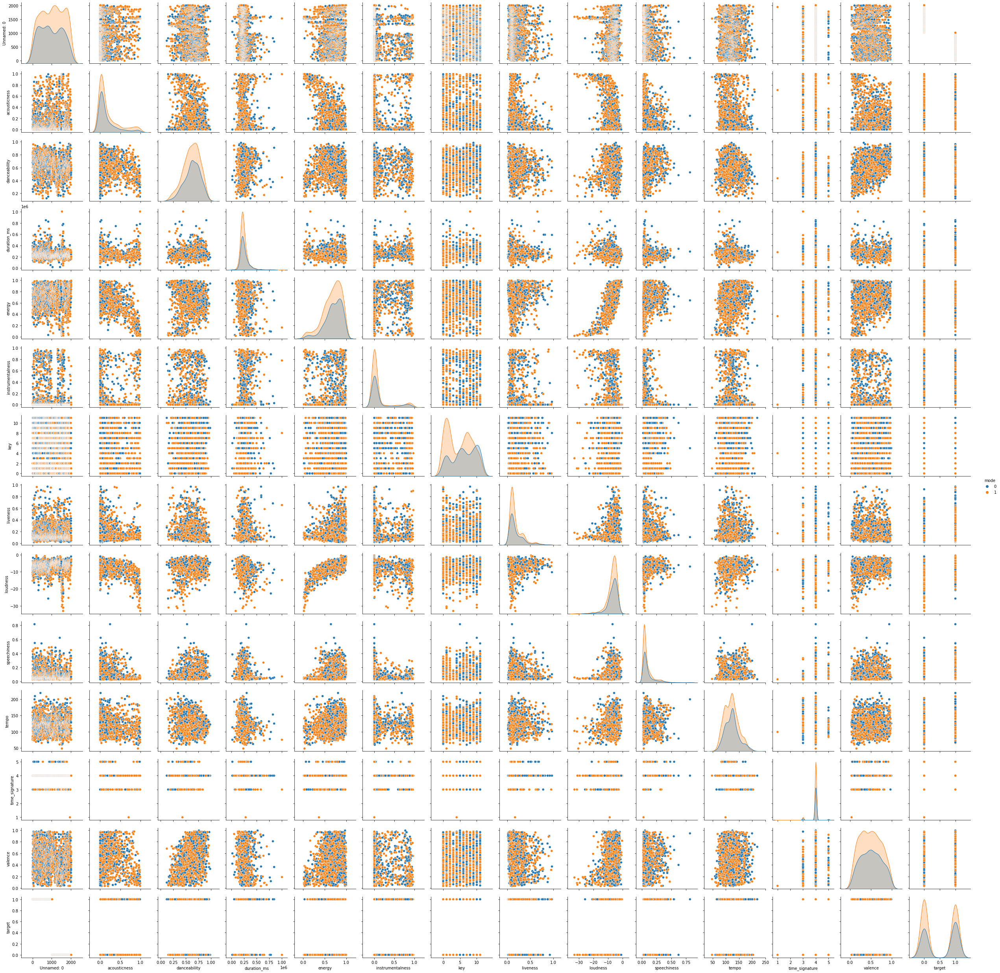

In [21]:
sns.pairplot(df, hue = 'mode')

In [22]:
df['artist'].nunique

<bound method IndexOpsMixin.nunique of 0                 Future
1       Childish Gambino
2                 Future
3            Beach House
4            Junior Boys
              ...       
2012      Kill The Noise
2013      Dillon Francis
2014            Rain Man
2015          Twin Moons
2016           Bleachers
Name: artist, Length: 2017, dtype: object>

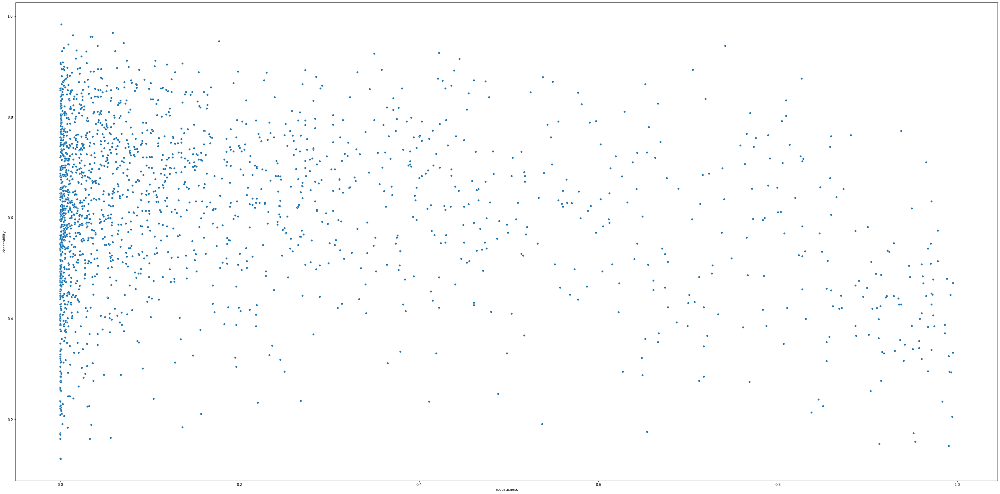

In [23]:
plt.figure(figsize=(50,25))
sns.scatterplot(x='acousticness', y='danceability',data=newdf)
plt.show()

In [24]:
import plotly.express as px   #importing plotly
fig2 = px.scatter(newdf, x='liveness', y='danceability', color="danceability",size='liveness')
fig2.show()

In [25]:
pd.isnull(newdf).sum().sum()


0

In [26]:
import plotly.express as px 
fig2 = px.scatter(newdf, x='key', y='danceability', color="danceability",size='key')
fig2.show()

In [27]:
kmeans = KMeans(n_clusters=5).fit(newdf)
centroids = kmeans.cluster_centers_
print(centroids)

[[ 1.04179907e+03  1.68649611e-01  6.15490128e-01  2.34930732e+05
   6.89704994e-01  5.34610918e+00  1.89166318e-01 -6.64229036e+00
   6.24854820e-01]
 [ 8.27120968e+02  2.53300797e-01  6.57943548e-01  4.17840073e+05
   5.90810484e-01  5.67741935e+00  1.64004032e-01 -1.04763065e+01
   5.32258065e-01]
 [ 1.06640775e+03  1.96398028e-01  6.20175194e-01  1.80349462e+05
   7.05781705e-01  5.11317829e+00  1.90197674e-01 -6.45820310e+00
   6.43410853e-01]
 [ 8.97839335e+02  1.82619190e-01  6.13991690e-01  3.02813075e+05
   6.56260388e-01  5.68144044e+00  1.98268421e-01 -7.82595568e+00
   5.65096953e-01]
 [ 8.31961538e+02  3.51931923e-01  5.45038462e-01  6.56582615e+05
   5.96361538e-01  4.61538462e+00  2.87357692e-01 -1.08815000e+01
   4.61538462e-01]]


NameError: name 'data' is not defined

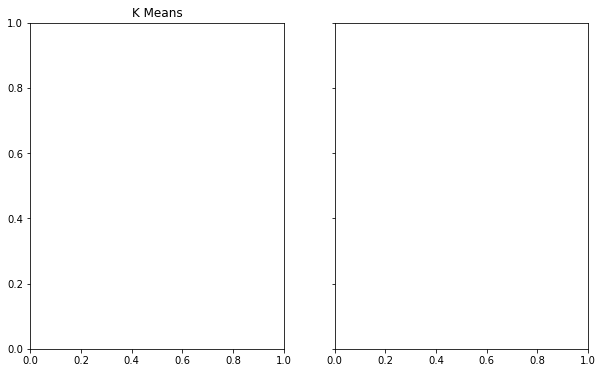

In [28]:
f, (ax1, ax2) = plt.subplots(1, 2, sharey=True,figsize=(10,6))
ax1.set_title('K Means')
ax1.scatter(data[0][:,0],data[0][:,1],c=kmeans.labels_,cmap='rainbow')
ax2.set_title("Original")
ax2.scatter(data[0][:,0],data[0][:,1],c=data[1],cmap='rainbow')

In [29]:
newdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2017 entries, 0 to 2016
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    2017 non-null   int64  
 1   acousticness  2017 non-null   float64
 2   danceability  2017 non-null   float64
 3   duration_ms   2017 non-null   int64  
 4   energy        2017 non-null   float64
 5   key           2017 non-null   int64  
 6   liveness      2017 non-null   float64
 7   loudness      2017 non-null   float64
 8   mode          2017 non-null   int64  
dtypes: float64(5), int64(4)
memory usage: 141.9 KB


In [30]:
newdf.head()

,Unnamed: 0,acousticness,danceability,duration_ms,energy,key,liveness,loudness,mode
0,0,0.0102,0.833,204600,0.434,2,0.1650,-8.795,1
1,1,0.1990,0.743,326933,0.359,1,0.1370,-10.401,1
2,2,0.0344,0.838,185707,0.412,2,0.1590,-7.148,1
3,3,0.6040,0.494,199413,0.338,5,0.0922,-15.236,1
4,4,0.1800,0.678,392893,0.561,5,0.4390,-11.648,0


In [31]:
x = newdf.drop('mode',axis=1)
y=newdf['mode']

In [32]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.25,random_state=42)

In [33]:
sc = StandardScaler()
x_train = sc.fit_transform(x_train)
x_test = sc.fit_transform(x_test)


In [34]:
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(x_train,y_train)
y_pred = knn.predict(x_test)

In [35]:
#KNeighborsClassifier
print(classification_report(y_test,y_pred))
confusion_matrix(y_test, y_pred)

              precision    recall  f1-score   support

           0       0.45      0.41      0.43       204
           1       0.62      0.66      0.64       301

    accuracy                           0.56       505
   macro avg       0.53      0.53      0.53       505
weighted avg       0.55      0.56      0.55       505



array([[ 83, 121],
       [103, 198]], dtype=int64)

In [36]:
classifier=LogisticRegression(random_state=42)
classifier.fit(x_train,y_train)

LogisticRegression(random_state=42)

In [37]:
y_pred = classifier.predict(x_test)
y_pred

array([1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1,
       0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1,
       0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1,
       1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1,

In [38]:
#LogisticRegression
cm = confusion_matrix(y_test,y_pred)
accuracy_score(y_test,y_pred)
print(classification_report(y_test,y_pred))
print(cm)

              precision    recall  f1-score   support

           0       0.56      0.22      0.32       204
           1       0.63      0.88      0.73       301

    accuracy                           0.62       505
   macro avg       0.59      0.55      0.52       505
weighted avg       0.60      0.62      0.56       505

[[ 45 159]
 [ 35 266]]


In [39]:
rfc = RandomForestClassifier(n_estimators = 100,random_state = 42, max_features = 8)
rfc.fit(x_train,y_train)

RandomForestClassifier(max_features=8, random_state=42)

In [40]:
y_pred_rfc = rfc.predict(x_test)
y_pred_rfc

array([1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1,
       0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0,
       0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1,
       0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1,
       1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1,
       0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
       1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0,
       1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1,
       0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1,

In [41]:
#RandomForestClassifier
cm = confusion_matrix(y_test,y_pred_rfc)
print(classification_report(y_test,y_pred_rfc))
print(cm)

              precision    recall  f1-score   support

           0       0.58      0.40      0.48       204
           1       0.66      0.80      0.73       301

    accuracy                           0.64       505
   macro avg       0.62      0.60      0.60       505
weighted avg       0.63      0.64      0.63       505

[[ 82 122]
 [ 59 242]]


In [42]:
svm = svm.SVC(kernel= 'linear',C = 0.01)
svm.fit(x_train,y_train)

SVC(C=0.01, kernel='linear')

In [43]:
y_pred_svm = svm.predict(x_test)
y_pred_svm

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [44]:
#SupportVectorMachine
cm = confusion_matrix(y_test,y_pred_svm)
print(classification_report(y_test,y_pred_svm))
print(cm)

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       204
           1       0.60      1.00      0.75       301

    accuracy                           0.60       505
   macro avg       0.30      0.50      0.37       505
weighted avg       0.36      0.60      0.45       505

[[  0 204]
 [  0 301]]


C:\Users\eddyk\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\eddyk\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\eddyk\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

